<center>
<img src="../images/ods_stickers.jpg" />
    
# Introducción al Machine Learning 2020

Basado en material de Pattern Classsification Duda, Hart, Stork. Traducido y editado al español por [Ana Georgina Flesia](https://www.linkedin.com/in/georginaflesia/). Este material esta sujeto a los términos y condiciones de la licencia  [Creative Commons CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0/). Se permite el uso irrestricto para todo propósito no comercial.Copyright (c) 2019 [Georgina Flesia](georgina.flesia@unc.edu.ar)


In [65]:
import warnings
warnings.filterwarnings("ignore")

# IntML2020- KDE y KNN

# Ejercicio 1: 

Sea $p(x)\sim U(0,a)$ uniforme en [0,a] y sea $\phi(x)=\exp(x), x>0$ el kernel exponencial. 

* a) Muestre que la esperanza del estimador basado en ventana de Parzen exponencial es  
\begin{equation}
\overline{p}_{n}(x)=\left\{\begin{array}{ll}{0} & {x<0} \\ {\frac{1}{a}\left(1-e^{-x / h_{n}}\right)} & {0 \leq x \leq a} \\ {\frac{1}{a}\left(e^{a / h_{n}}-1\right) e^{-x / h_{n}}} & {a \leq x}\end{array}\right.
\end{equation}

* b) Plotee esta curva con a=1, $h_n$=1, 1/4 y 1/16

* c) Cuan chico tiene que ser $h_n$ para tener menos del 1% de desvio sobre el 99\% del rango 0<x<a?

* d) Encuentre $h_n$ para esta condicion si a=1 y plotee $\overline{p}_n(x)$ en el rango $0\leq x \leq 0.05$ 

# *Respuesta*

 <span style="color:red"> INCISO  (a)  </span>
 
 Tenemos que el estimador de la densidad, para una muestra de tamaño $n$, está dado por:

$$\hat p_n(x) = \frac 1n \sum \frac 1{V_n} \phi\left(\frac{x-x_i}{h_n}\right),$$
donde $x_i$ son las muestras que caen dentro de la región de volumen $V_n$ centrada en $x$.

Esta región es, para el caso general, un hipercubo de lado $h_n$ y por lo tanto $V_n = h_n^d$, donde $d$ es la dimensión del espacio.

Si asumimos que las muestras $x_i$ provienen de una distribución uniforme $\mathcal U(0,a)$, y que $\phi(x) = e^{-x}$ para $x>0$, entonces el valor esperado de $\hat p_n(x)$ es:
\begin{eqnarray*}
E[\hat p_n(x)] &=& \frac 1n \sum \frac{1}{h^1} E[ e^{-\frac{x-x_i}{h_n}} \mathbb I_{(0,x)}(x_i)] \\ 
&=&
\frac 1n \sum \frac 1h \int_0^a e^{-\frac{x-u}{h_n}} \mathbb I_{(0,x)}(u)\frac 1a\,du
\end{eqnarray*}
La función indicadora está incluida porque la densidad exponencial es $0$ en los negativos.
Analizamos entonces los siguientes casos:
- si $x<0$, entonces para todo $u \in (0,a)$ se cumple $x-u<0$. Por lo tanto $\mathbb I_{(0,x)}(u) = 0$ y el valor esperado resulta $0$.
- si $x \ge a$, entonces para todo $u \in (0,a)$ se cumple $x-a>0$. Luego $\mathbb I_{(0,x)}(u) = 1$.
- si $0 < x < a$, entonces la integral en el valor esperado es nula para $u>x$. 

Observando que en la sumatoria se calcula siempre el mismo valor, se reemplaza por la multiplicación por $n$ y así tenemos que:

Caso $x\ge a$:
\begin{eqnarray*}
E[\hat p_n(x)] &=& \frac 1n \cdot n \frac 1{a\,h_n} \int_0^a e^{-\frac{x-u}{h_n}} \,du 
\\
&=& \frac 1{a\,h_n} e^{-x/h_n} (h_n) e^{u/h_n} \bigr|_0^a = \frac 1{ah_n} h_n e^{-x/h_n}\,(e^{a/h_n}-1) \\
&=& \frac 1a e^{-x/h_n} (e^{a/h_n}-1) 
\end{eqnarray*}

Caso $0<x<a$:
\begin{eqnarray*}
E[\hat p_n(x)] &=& \frac 1n \cdot n \frac 1{a\,h_n} \int_0^x e^{-\frac{x-u}{h_n}} \,du 
\\
&=& \frac 1{a\,h_n} e^{-x/h_n} (h_n) e^{u/h_n} \bigr|_0^x = \frac 1{ah_n} h_n e^{-x/h_n}\,(e^{x/h_n}-1) \\
&=& \frac 1a (1-e^{x/h_n}) 
\end{eqnarray*}

En particular si $h_n$ tiende a $0$ el valor esperado tiende a la distribución uniforme $p(x)$.

c) La varianza del estimador está dado por:
\begin{eqnarray}
Var(\hat p) = E[(\hat p - p)^2] &=& \int_0^a \frac 1a\,1-\hat p(u))^2\,du = \frac 1{a^2}
\int_0^a (1- (1-e^{-u/h_n}))^2 \,du \\
&=& \frac 1{a^2} \int_0^a e^{-2u/h_n}\,du \\
&=& \frac{-h_n}{2a^2} e^{-2u/h_n}\bigr|_0^a = \frac{h_n}{2a^2}\left(1-e^{-2a/h_n}\right).
\end{eqnarray}

El sesgo (bias) sobre $0<x<a$ es:
$$ \hat p(x) - p(x) = \frac 1a \,(1 - (1-e^{-x/h_n}) = \frac 1a e^{-x/h_n}.$$
Este sesgo es decreciente en $x$. Entonces para que el sesgo sea menor que el 1% en el 99% del intervalo $(0,a)$ calculamos:
\begin{eqnarray}
\frac 1a e^{-x/h_n} &<& 0.01, \qquad x \ge 0.01 \cdot a,\\
-\frac x{h_n}  &<& \ln 0.01 + \ln a \\
-\frac x{\ln (0.01 \cdot a)} &>& h_n, \qquad x \ge 0.01\cdot a \\
h_n &<& \frac{0.01}{- \ln (0.01\cdot a)} = 0.01\cdot a \cdot \ln(100/a).
\end{eqnarray}
Para el caso $a=1$ resulta $h_n < 0.046$, aproximadamente.




 <span style="color:red"> RESPONDA EL INCISO  (b) AQUÍ </span>

In [16]:
import numpy as np
import matplotlib.pyplot as plt

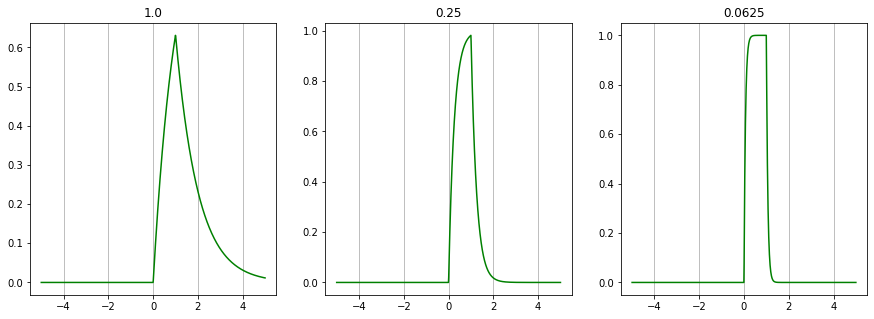

In [44]:

#    if x<0:
#        return 0
#    elif 0<=x<=a:
#        return (1-np.exp(-x/h_n))/a
#    elif a<x:
#        return (np.exp(a/h_n)-1)*np.exp(-x/h_n)/a
    
def p_n(x,a,h_n):    
    return np.piecewise(x, [x < 0, ((x >= 0) & (x < a)), x >= a], 
                            [lambda x : 0, lambda x : (1-np.exp(-x/h_n))/a, lambda x : (np.exp(a/h_n)-1)*np.exp(-x/h_n)/a])

x = np.linspace(-5,5,1000)
a = 1
h = [1.,0.25,0.0625]

plt.subplots(1,3,figsize=(15,5))

for h_n in h:
    p_vec = np.vectorize(p_n,excluded=['a','h_n'])
    p = p_vec(x,a,h_n)
    plt.subplot(1,3,h.index(h_n)+1)
    plt.plot(x,p,color='green',linestyle='solid')
    plt.grid(True, axis='x')
    plt.title(h_n)
#    plt.legend()                

In [31]:
len(p_n(x,a,h_n))
type(np.vectorize(p,excluded=['a','h_n']))

numpy.vectorize

 <span style="color:red"> RESPONDA EL INCISO  (c) AQUÍ </span>

Respondido arriba

 <span style="color:red"> RESPONDA EL INCISO  (d) AQUÍ </span>

Se encuentra que $h_n<0.046$ para cumplir con la condición deseada. 

Text(0.5, 1.0, '$h_n=0.045$')

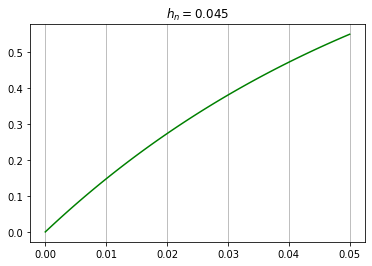

In [46]:
x = np.linspace(0,0.05,100)
a = 1
h = 0.045

p_vec = np.vectorize(p_n,excluded=['a','h_n'])
p = p_vec(x,a,h_n)
plt.plot(x,p,color='green',linestyle='solid')
plt.grid(True, axis='x')
plt.title(r'$h_n=0.045$')

# Ejercicio 2:  
Pruebe que si $P^*$ es el error de bayes, y
\begin{equation}
P=\lim _{n \rightarrow \infty} P_{n}(e)
\end{equation}
es el error de la regla del vecino mas cercano, entonces 
\begin{equation}
P^{*} \leq P \leq P^{*}\left(2-\frac{c}{c-1} P^{*}\right)
\end{equation}
 use las paginas 179 a 182 del libro para esbozar su prueba. 


# *Respuesta*

Denotamos con $P_n(e)$ la probabilidad del error para la regla del vecino más cercano y muestras de tamaño $n$.

El error ocurre para una muestra $x'$ que es vecino más cercano de $x$ si a $x'$ se lo clasifica en una clase errónea. Es decir que:
$$P_n(e) = \sum_{x,x'}P_n(e | x,x').p(x,x').$$

Dadas las $n$ muestras correspondientes a $c$ clases distintas, cada muestra es un par $(x',\theta_j)$, donde $\theta_j$ significa que $x'$ corresponde a la clase $j$.
Así un error ocurre si $x'$ es el vecino más cercano a $x$, y $\theta_j$ es distinto de la clase $\theta$ de $x$. Asumiendo que las muestras son todas independientes tenemos que:
$$P(\theta, \theta_j | x,x') = P(\theta|x)P(\theta_j|x').$$

Sumando sobre todas la posibles clases de $x$ ($1 \le i \le c$), la probabilidad del error es uno menos la probabilidad de los aciertos:
$$P(e | x,x') = 1 - \sum_i P(\theta=i, \theta_j=i|x,x') = 1- \sum_j P(\theta|x) P(\theta_j=i|x').$$

Ahora bien, tenemos que
$$P(e | x) = \int P(e|x,x')p(x'|x)dx' = \int\left( 1- \sum_j P(\omega_i|x) P(\omega_i|x') \right)p(x'|x)dx'.$$
Si $n$ tiende a infinito, entonces $x'$ está muy próximo a $x$ y podemos asumir que la densidad $p(x'|x)$ converge a una delta de Dirac:
$$p(x'|x) \mapsto _{n \to \infty} \delta(x-x'),$$
y entonces resulta:
$$P(e | x) = \int\left( 1- \sum_j P(\omega_i|x) P(\omega_i|x') \right)\delta(x-x')dx' = 1 - \sum_{i=1}^c P^2(\omega_i|x).$$
Volviendo al error de Bayes, es evidente que $P^* \le P$. Para ver la cota superior, consideramos $x$ y su clase $\omega_m$. Queremos minimizar:
$$\sum_{i=1}^c P^2(\omega_i|x) = P^2(\omega_m|x) + \sum_{i\neq m}^c P^2(\omega_i|x).$$

El segundo término se minimiza si todas las probabilidades en la sumatoria son iguales, esto es:
$$P(\omega_i|x) = \frac{1-P(\omega_m|x)}{c-1}.$$
Como $1-P(\omega_m|x) = P^*(e|x)$ tenemos que:
$$\sum_{i=1}^c P^2(\omega_i | x) \ge (1-P^*(e | x))^2 + \frac{P^{*2}(e|x)}{c-1}.$$
Por otra parte,
$$Var(P^*(e|x)) = \int[P^*(e|x)-P^*)^2 p(x)dx = \int P^{*2}(e|x)p(x)dx - P^{*2} \ge 0$$
de donde
$$\int P^{*2}(e|x)p(x)dx \ge P^{*2}.$$
Uniendo las fórmulas resulta, para un número infinito de muestras,
$$P^* \le P \le P^* \cdot \left(2-\frac{c}{c-1}P^*\right).$$


# Ejercicio 3 

 a) Estudie el siguiente código que realiza un estimador nuevo basado en Ventana de Parzen gaussiana dentro de el framework de scikitlearn
 * Observe que usando la función del paquete sklearn.neighbors KernelDensity se crea un nuevo clasificador bayesiano basado en la estimacion de ventanas de Parzen con kernels especificados. 
 * Identifique los priors y la función de pérdida codificada. 
 * Identifique que linea del código cambiaría si quisiera usar otro discriminante, por ejemplo, si quisiera ingresar función de pérdida general y priors como parámetros. 

In [49]:
from sklearn.base import BaseEstimator, ClassifierMixin
#BaseEstimator es la clase base de todos los estimadores en scikit-learn
#ClassifierMixin es la clase mixin para todos los estimadores en scikit-learn
from sklearn.neighbors import KernelDensity
class KDEClassifier(BaseEstimator, ClassifierMixin):
    """Bayesian generative classification based on KDE
    
    Parameters
    ----------
    bandwidth : float
        the kernel bandwidth within each class
    kernel : str
        the kernel name, passed to KernelDensity
    """
    #Inicializamos el ancho de banda, que tomará el valor 1.0, y el kernel, que sera de tipo gaussiano
    def __init__(self, bandwidth=1.0, kernel='gaussian'):
        self.bandwidth = bandwidth
        self.kernel = kernel
    
    #Definimos la funcion con la que vamos a ajustar los datos
    def fit(self, X, y):
        self.classes_ = np.sort(np.unique(y)) #arma un array en orden ascendente con valores no repetidos de y i.e las clases 
        training_sets = [X[y == yi] for yi in self.classes_] #elige los x correspondientes a los y filtrados en el paso anterior
        self.models_ = [KernelDensity(bandwidth=self.bandwidth,
                                      kernel=self.kernel).fit(Xi) 
                        for Xi in training_sets]  #Aca le pasamos al paquete KernelDensity el kernel que inicializamos con su ancho de banda
                                                  #definiendo asi el modelo y ajustamos sobre el set de entrenamiento
        self.logpriors_ = [np.log(Xi.shape[0] / X.shape[0]) 
                           for Xi in training_sets] #Aca definimos los priors para hacer la clasificación de Bayes para cada elemento 
                                                    #en el set de entrenamiento 
        return self
        
    def predict_proba(self, X):
        logprobs = np.array([model.score_samples(X)
                             for model in self.models_]).T #Devuelve la probabilidad condicional para cada muestra en el conjunto de entrenamiento
        result = np.exp(logprobs + self.logpriors_) #Creo que esta es la funcion de perdida definida para cada x del conjunto de entrenamiento,
                                                #definida como el exponencial de la suma de la probabilidad condicional y la probabilidad a priori
        return result / result.sum(1, keepdims=True) #Devuelve la probabilidad de cada clase para cada ejemplo en el conjunto de entrenamiento
        
    def predict(self, X):
        return self.classes_[np.argmax(self.predict_proba(X), 1)] #Devuelve las predicciones del modelo entrenado
    

 (b) Estudie el siguiente código  donde se busca el mejor bandwidth usando GridSearchCV y plots auxiliares

In [50]:
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_digits
from sklearn import svm
from sklearn.model_selection import GridSearchCV
digits = load_digits()

## datos son data y etiquetas target 

{'bandwidth': 6.135907273413174}
accuracy = 0.9677298050139276


Text(0.5, 1.0, 'KDE Model Performance')

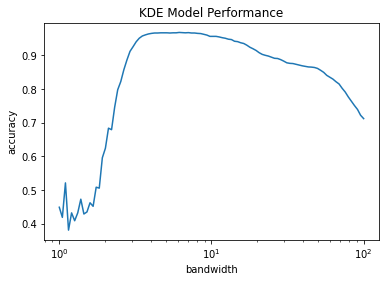

In [51]:
bandwidths = 10 ** np.linspace(0, 2, 100)
grid = GridSearchCV(KDEClassifier(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)

print(grid.best_params_)
print('accuracy =', grid.best_score_)

scores = grid.cv_results_['mean_test_score']
plt.semilogx(bandwidths, scores)
plt.xlabel('bandwidth')
plt.ylabel('accuracy')
plt.title('KDE Model Performance')

(c) Ajuste el clasificador codificado con Kernel gaussiano a la database dígitos,  usando el ancho de banda  default. Compare con el valor  estimado usando  GridSearchCV. Diga cual es la exactitud (accuracy) usando el bandwidth estimado y cual es la exactitud usando el default. 


(d) Encuentre el ancho de banda óptimo usando GridSearchCV para clasificadores con  kernels Exponencial  y de Echetnikov para la database digits. Compare el valor de accuracy que le corresponde con el generado usando el default. 
    

# *Respuesta*

 <span style="color:red"> RESPONDA EL INCISO  (a) AQUÍ </span>

Respondido en los comentarios realizados en el código

 <span style="color:red"> RESPONDA EL INCISO  (c) AQUÍ </span>

In [59]:
bandwidths = [1,6.135907273413174]
grid = GridSearchCV(KDEClassifier(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)
scores = grid.cv_results_['mean_test_score']
print('La exactitud conseguida con el bandwidth default es', scores[0])
print('La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV es', scores[1])

La exactitud conseguida con el bandwidth default es 0.44853141442277933
La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV es 0.9677298050139276


 <span style="color:red"> RESPONDA EL INCISO  (d) AQUÍ </span>

### Con kernel exponencial 

In [60]:
class KDEClassifier_exponencial(BaseEstimator, ClassifierMixin):
    """Bayesian generative classification based on KDE
    
    Parameters
    ----------
    bandwidth : float
        the kernel bandwidth within each class
    kernel : str
        the kernel name, passed to KernelDensity
    """
    #Inicializamos el ancho de banda, que tomará el valor 1.0, y el kernel, que sera de tipo gaussiano
    def __init__(self, bandwidth=1.0, kernel='exponential'):
        self.bandwidth = bandwidth
        self.kernel = kernel
    
    #Definimos la funcion con la que vamos a ajustar los datos
    def fit(self, X, y):
        self.classes_ = np.sort(np.unique(y)) #arma un array en orden ascendente con valores no repetidos de y i.e las clases 
        training_sets = [X[y == yi] for yi in self.classes_] #elige los x correspondientes a los y filtrados en el paso anterior
        self.models_ = [KernelDensity(bandwidth=self.bandwidth,
                                      kernel=self.kernel).fit(Xi) 
                        for Xi in training_sets]  #Aca le pasamos al paquete KernelDensity el kernel que inicializamos con su ancho de banda
                                                  #definiendo asi el modelo y ajustamos sobre el set de entrenamiento
        self.logpriors_ = [np.log(Xi.shape[0] / X.shape[0]) 
                           for Xi in training_sets] #Aca definimos los priors para hacer la clasificación de Bayes para cada elemento 
                                                    #en el set de entrenamiento 
        return self
        
    def predict_proba(self, X):
        logprobs = np.array([model.score_samples(X)
                             for model in self.models_]).T #Devuelve la probabilidad condicional para cada muestra en el conjunto de entrenamiento
        result = np.exp(logprobs + self.logpriors_) #Creo que esta es la funcion de perdida definida para cada x del conjunto de entrenamiento,
                                                #definida como el exponencial de la suma de la probabilidad condicional y la probabilidad a priori
        return result / result.sum(1, keepdims=True) #Devuelve la probabilidad de cada clase para cada ejemplo en el conjunto de entrenamiento
        
    def predict(self, X):
        return self.classes_[np.argmax(self.predict_proba(X), 1)] #Devuelve las predicciones del modelo entrenado

{'bandwidth': 1.8307382802953682}
accuracy = 0.9671757969668834


Text(0.5, 1.0, 'KDE Model Performance')

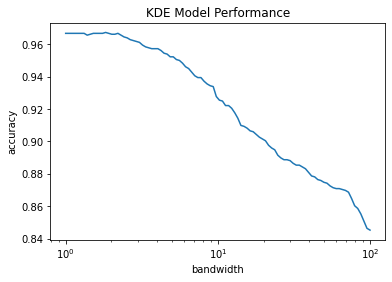

In [61]:
bandwidths = 10 ** np.linspace(0, 2, 100)
grid = GridSearchCV(KDEClassifier_exponencial(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)

print(grid.best_params_)
print('accuracy =', grid.best_score_)

scores = grid.cv_results_['mean_test_score']
plt.semilogx(bandwidths, scores)
plt.xlabel('bandwidth')
plt.ylabel('accuracy')
plt.title('KDE Model Performance')

In [62]:
bandwidths = [1,1.8307382802953682]
grid = GridSearchCV(KDEClassifier_exponencial(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)
scores = grid.cv_results_['mean_test_score']
print('La exactitud conseguida con el bandwidth default para kernel exponencial es', scores[0])
print('La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV para kernel exponencial es', scores[1])

La exactitud conseguida con el bandwidth default para kernel exponencial es 0.9666186939028165
La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV para kernel exponencial es 0.9671757969668834


### Con kernel de Echetnikov

In [63]:
class KDEClassifier_echetnikov(BaseEstimator, ClassifierMixin):
    """Bayesian generative classification based on KDE
    
    Parameters
    ----------
    bandwidth : float
        the kernel bandwidth within each class
    kernel : str
        the kernel name, passed to KernelDensity
    """
    #Inicializamos el ancho de banda, que tomará el valor 1.0, y el kernel, que sera de tipo gaussiano
    def __init__(self, bandwidth=1.0, kernel='epanechnikov'):
        self.bandwidth = bandwidth
        self.kernel = kernel
    
    #Definimos la funcion con la que vamos a ajustar los datos
    def fit(self, X, y):
        self.classes_ = np.sort(np.unique(y)) #arma un array en orden ascendente con valores no repetidos de y i.e las clases 
        training_sets = [X[y == yi] for yi in self.classes_] #elige los x correspondientes a los y filtrados en el paso anterior
        self.models_ = [KernelDensity(bandwidth=self.bandwidth,
                                      kernel=self.kernel).fit(Xi) 
                        for Xi in training_sets]  #Aca le pasamos al paquete KernelDensity el kernel que inicializamos con su ancho de banda
                                                  #definiendo asi el modelo y ajustamos sobre el set de entrenamiento
        self.logpriors_ = [np.log(Xi.shape[0] / X.shape[0]) 
                           for Xi in training_sets] #Aca definimos los priors para hacer la clasificación de Bayes para cada elemento 
                                                    #en el set de entrenamiento 
        return self
        
    def predict_proba(self, X):
        logprobs = np.array([model.score_samples(X)
                             for model in self.models_]).T #Devuelve la probabilidad condicional para cada muestra en el conjunto de entrenamiento
        result = np.exp(logprobs + self.logpriors_) #Creo que esta es la funcion de perdida definida para cada x del conjunto de entrenamiento,
                                                #definida como el exponencial de la suma de la probabilidad condicional y la probabilidad a priori
        return result / result.sum(1, keepdims=True) #Devuelve la probabilidad de cada clase para cada ejemplo en el conjunto de entrenamiento
        
    def predict(self, X):
        return self.classes_[np.argmax(self.predict_proba(X), 1)] #Devuelve las predicciones del modelo entrenado

{'bandwidth': 29.836472402833405}
accuracy = 0.9593887341380377


Text(0.5, 1.0, 'KDE Model Performance')

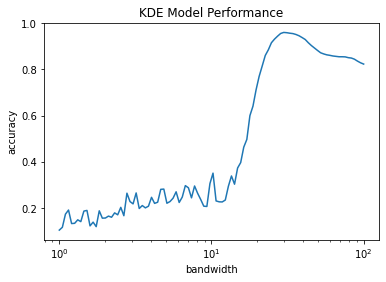

In [66]:
bandwidths = 10 ** np.linspace(0, 2, 100)
grid = GridSearchCV(KDEClassifier_echetnikov(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)

print(grid.best_params_)
print('accuracy =', grid.best_score_)

scores = grid.cv_results_['mean_test_score']
plt.semilogx(bandwidths, scores)
plt.xlabel('bandwidth')
plt.ylabel('accuracy')
plt.title('KDE Model Performance')

In [68]:
bandwidths = [1,29.836472402833405]
grid = GridSearchCV(KDEClassifier_echetnikov(), {'bandwidth': bandwidths})

grid.fit(digits.data, digits.target)
scores = grid.cv_results_['mean_test_score']
print('La exactitud conseguida con el bandwidth default para kernel de epanechnikov es', scores[0])
print('La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV para kernel de epanechnikov es', scores[1])

La exactitud conseguida con el bandwidth default para kernel de epanechnikov es 0.10405756731662023
La exactitud conseguida con el mejor bandwidth estimado por GridSearchSV para kernel de epanechnikov es 0.9593887341380377


# Ejercicio 4:

 a) Considere el codigo siguiente que levanta el grupo de datos de cancer de mama y plotea las primeras 10 variables  usando el paquete seaborn. Realice un plot del mismo estilo con las siguientes 10 variables (el dataset tiene 31 variables), y otro con las restantes 10 variables. La ultima variables es target, la etiqueta binaria de las clases.  Inspecione sus gráficos y diga que puede observar de las variables que lo ayude a seleccionar variables para clasificación.


In [69]:
from sklearn.datasets import load_breast_cancer
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import decomposition
cancer = load_breast_cancer()
X = cancer.data
names = cancer.feature_names
y = cancer.target
Xnames = names.tolist()
Y_labels = cancer.target_names

In [32]:
print(Xnames)

['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension']


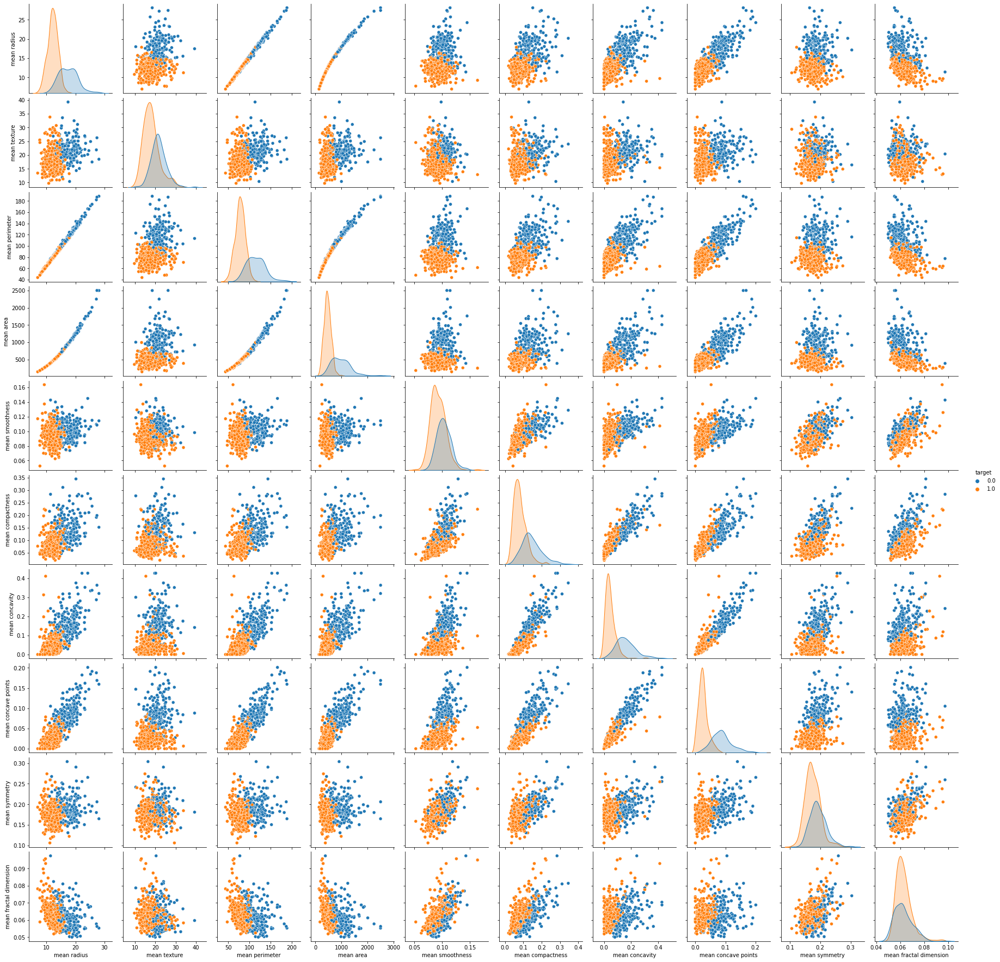

In [71]:
import seaborn as sns

data1 = pd.DataFrame(data= np.c_[cancer['data'], cancer['target']],columns= Xnames + ['target'])


vars=['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 
      'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension','target']

data2=data1.loc[:,vars]

vars2=vars[0:10]

g2 = sns.pairplot(data2,vars=vars2, hue="target")

b) Podemos escalar las variables usando standard scaler, que centra restando por la media y divide por la desviacion estandar muestrales. En las primeras variables, los gráficos son muy parecidos, aunque se observa la diferencia en las escalas. Realice los gráficos para las restantes 20 variables, de a grupos de 10, e inspeccione. 

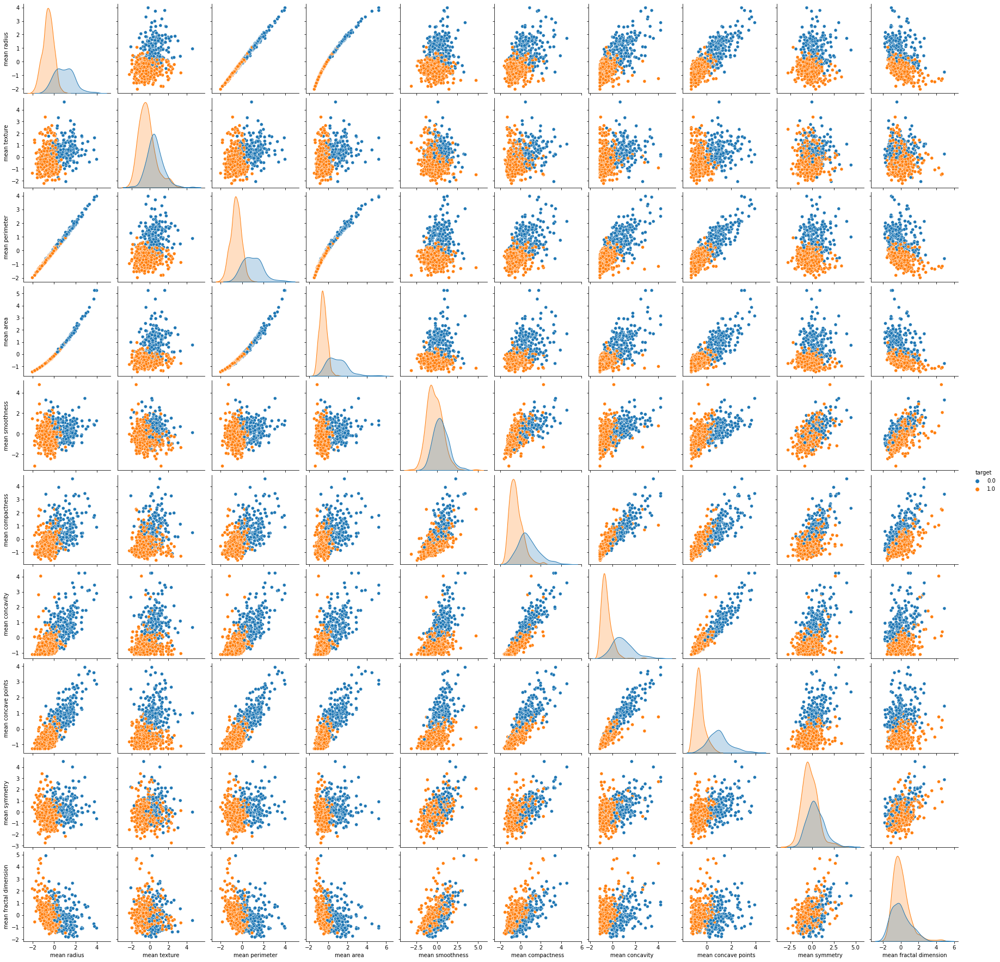

In [72]:
from sklearn.preprocessing import StandardScaler

X_data2 = data2.iloc[:, 0:10].values

scaler = StandardScaler()

X_data3 = scaler.fit_transform(X_data2)

data3 = pd.DataFrame(data= np.c_[X_data3, cancer['target']],columns=vars)

g2 = sns.pairplot(data3,vars=vars2, hue="target")

c) El siguiente codigo realiza PCA sobre todos los datos, los escala y calcula las regiones de clasificacion para 5-NN sobre las dos primeras PCA's. Calcule las regiones de clasificacion y los errores para $k$ variando entre 1 y 10. Genere un único plot con secciones para poder visualizar todas las regiones de clasificacion juntas. 

In [73]:
pca = decomposition.PCA(n_components=2)

scaler = StandardScaler()

X_data3 = scaler.fit_transform(cancer.data)

pca.fit(X_data3)
data3 = pca.transform(X_data3)

vr = pca.explained_variance_ratio_
print(pca.explained_variance_ratio_)

[0.44272026 0.18971182]


In [74]:
df = pd.DataFrame(data=np.c_[data3,y], columns=["PC1", "PC2", "labels"])

Aqui ploteo usando el paquete de Sebastian Raschka, mlxtend, que tienen que instalar para poder usar. 

<AxesSubplot:>

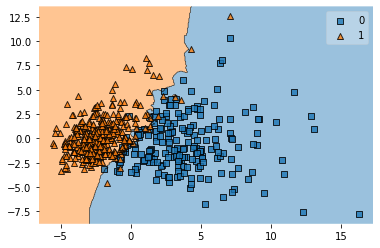

In [75]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(data3, y)
from mlxtend.plotting import plot_decision_regions

plot_decision_regions(data3, y, knn)

d) El siguiente codigo realiza PCA sobre todos los datos, sin escalar y calcula las regiones de clasificacion para 5-NN sobre las dos primeras PCA's. Calcule las regiones de clasificacion y los errores para $k$ variando entre 1 y 10. Genere un único plot con secciones para poder visualizar todas las regiones de clasificacion juntas. Compare con el plot anterior para ver si hay cambios visuales importantes en las regiones al escalar. 

<AxesSubplot:>

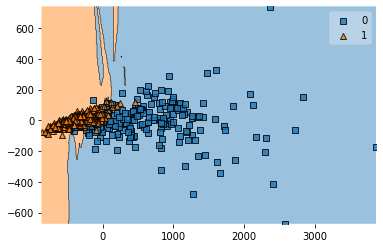

In [76]:
pca.fit(cancer.data)
data4 = pca.transform(cancer.data)
df4 = pd.DataFrame(data=np.c_[data4,y], columns=["PC1", "PC2", "labels"])
knn2 = KNeighborsClassifier(n_neighbors=5)
knn2.fit(data4, y)

plot_decision_regions(data4, y, knn2)

Y aqui uso Matplotlib en datos sin escalar. Vale la pena mirar como se codifica, aunque el código de Rashka es mas lindo. 

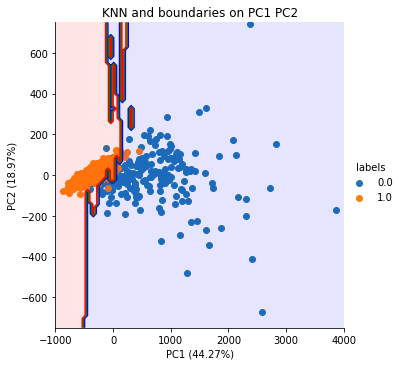

In [78]:
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D

# Our 2-dimensional distribution will be over variables X and Y
N = 100
X3 = np.linspace(-1000, 4000, N)
Y3 = np.linspace(-750, 750, N)
X3, Y3 = np.meshgrid(X3, Y3)


color_list = ['Blues','Greens','Reds']
my_norm = colors.Normalize(vmin=-1.,vmax=1.)

g = sns.FacetGrid(df4, hue="labels" , height=5) .map(plt.scatter, "PC1", "PC2",)  .add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz3 = np.array(  [knn2.predict( np.array([[xx3,yy3]])) 
                     for xx3, yy3 in zip(np.ravel(X3), np.ravel(Y3)) ] )
    
#Reshaping the predicted class into the meshgrid shape
Z3 = zz3.reshape(X3.shape)


#Plot the filled and boundary contours
my_ax.contourf( X3, Y3, Z3, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X3, Y3, Z3, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title

my_ax.set_xlabel('PC1 (44.27%)')
my_ax.set_ylabel('PC2 (18.97%)')
my_ax.set_title('KNN and boundaries on PC1 PC2')


#plt.savefig('images/04_pca_lda2.png', dpi=300)
plt.show()

e) Haga una tabla con el score de knn sobre la muestra para cada $k$ escalando y sin escalar. Utilice prettytable y  confusion matrix.  

knn score
0.9384885764499121


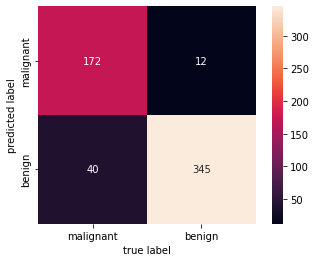

In [79]:
# datos sin escalar 

from sklearn.metrics import confusion_matrix
y_pred = knn.predict(data4)
print('knn score')
print(knn2.score(data4, y))

mat = confusion_matrix(y, y_pred)

#cmap=plt.cm.Reds
#cmap=plt.cm.Blues
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,
            xticklabels=Y_labels, yticklabels=Y_labels)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [80]:
print(Y_labels)

['malignant' 'benign']


knn score
0.9525483304042179


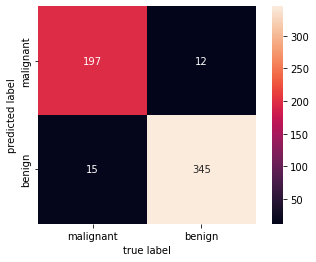

In [81]:
#datos escalados 

from sklearn.metrics import confusion_matrix
y_pred = knn.predict(data3)
print('knn score')
print(knn.score(data3, y))

mat = confusion_matrix(y, y_pred)

#cmap=plt.cm.Reds
#cmap=plt.cm.Blues
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,
            xticklabels=Y_labels, yticklabels=Y_labels)
plt.xlabel('true label')
plt.ylabel('predicted label');

# *Respuesta*

 <span style="color:red"> RESPONDA EL INCISO  (a) AQUÍ </span>

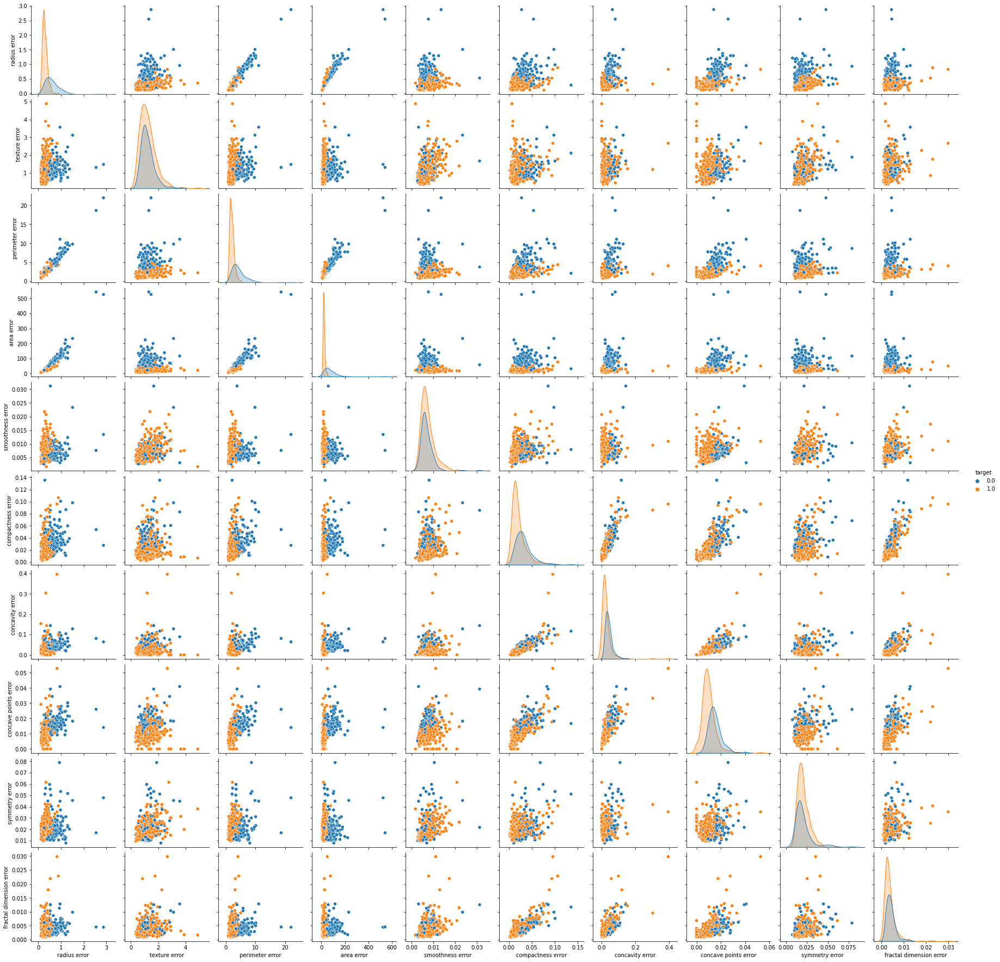

In [84]:
data1 = pd.DataFrame(data= np.c_[cancer['data'], cancer['target']],columns= Xnames + ['target'])


means=['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 
      'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension','target']
errors=['radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 
       'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'target']
worsts=['worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness',
 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension', 'target']

data_errors=data1.loc[:,errors]
data_worsts=data1.loc[:,worsts]

errors2=errors[0:10]
worsts2=worsts[0:10]

g_errors = sns.pairplot(data_errors,vars=errors2, hue="target")

Observando los histogramas, podemos ver que las categorias no presentan una variación apreciable en la media si discriminamos por targets, pero si en la desviación estandar. La mayoria de las categorias, al ser graficadas una en función de otras, no presentan una separación apreciable entre clases, pero algunas como 'radius error', 'perimeter error'o 'area error' si presentan mayor variación, por lo que aventuramos que seran mas importante en un analisis de PCA. 

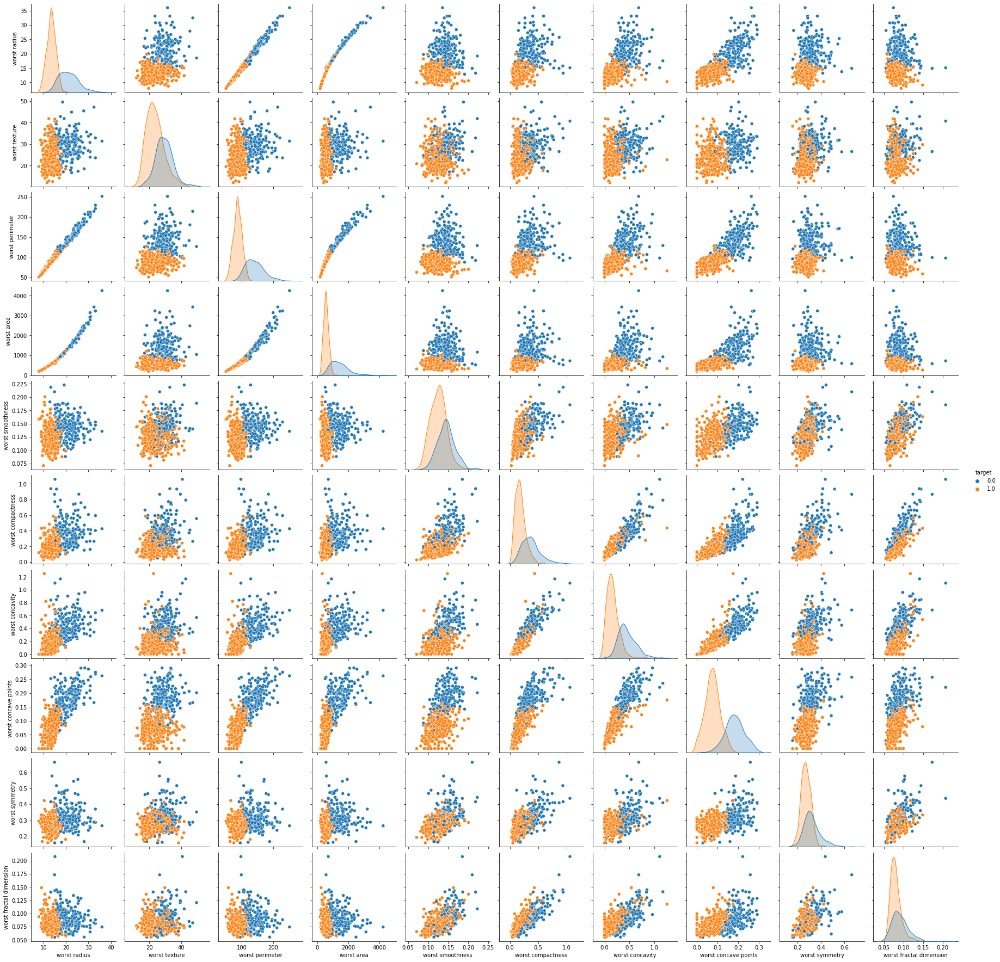

In [ ]:
g_errors = sns.pairplot(data_worsts,vars=worsts2, hue="target")

Observamos que las categorías 'worst radius', 'worst perimeter', 'worst area', 'worst concave points' presentan mayor variación y mayor separabilidad entre categorias, por lo que serán probablemente las mas influyentes en un analisis de PCA y LDA.  

 <span style="color:red"> RESPONDA EL INCISO  (b) AQUÍ </span>

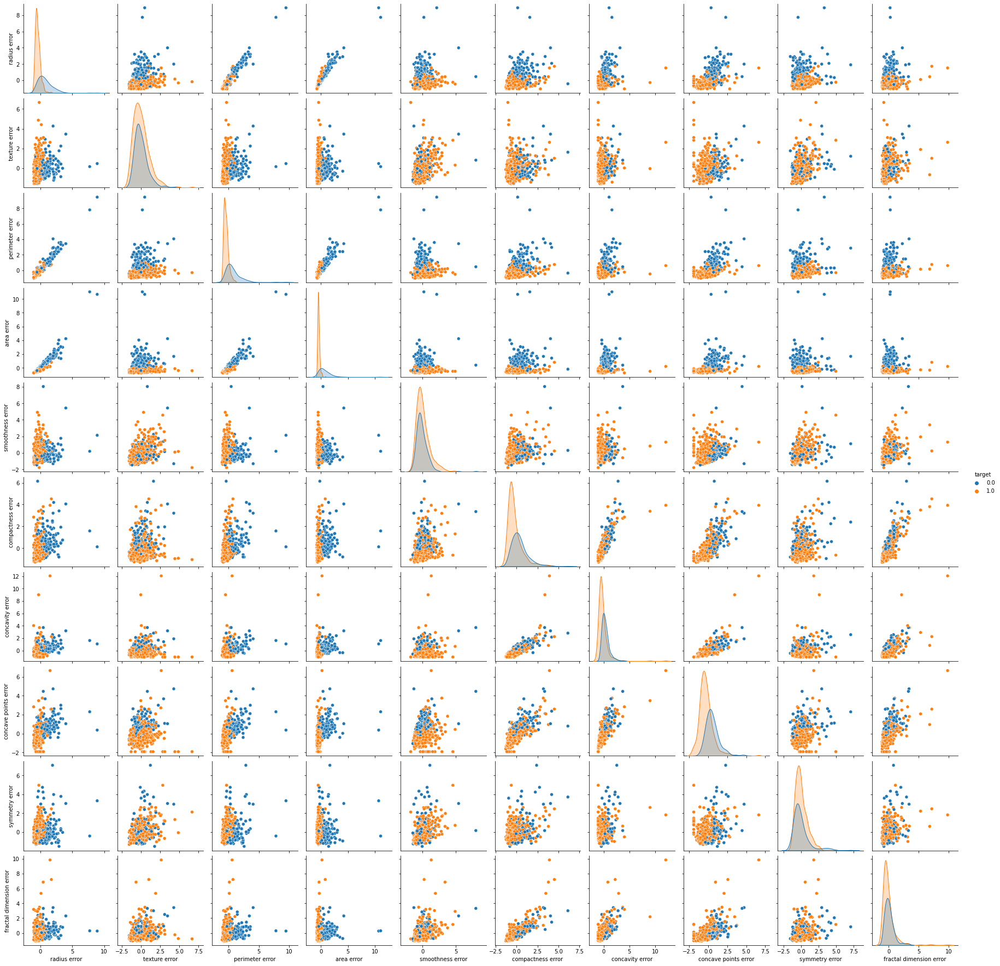

In [86]:
X_data_errors = data_errors.iloc[:, 0:10].values
X_data_worsts = data_worsts.iloc[:, 0:10].values

scaler = StandardScaler()

X_data_errors_scaled = scaler.fit_transform(X_data_errors)
X_data_worsts_scaled = scaler.fit_transform(X_data_worsts)

data_errors_scaled = pd.DataFrame(data= np.c_[X_data_errors_scaled, cancer['target']],columns=errors)
data_worsts_scaled = pd.DataFrame(data= np.c_[X_data_worsts_scaled, cancer['target']],columns=worsts)

g2 = sns.pairplot(data_errors_scaled,vars=errors2, hue="target")

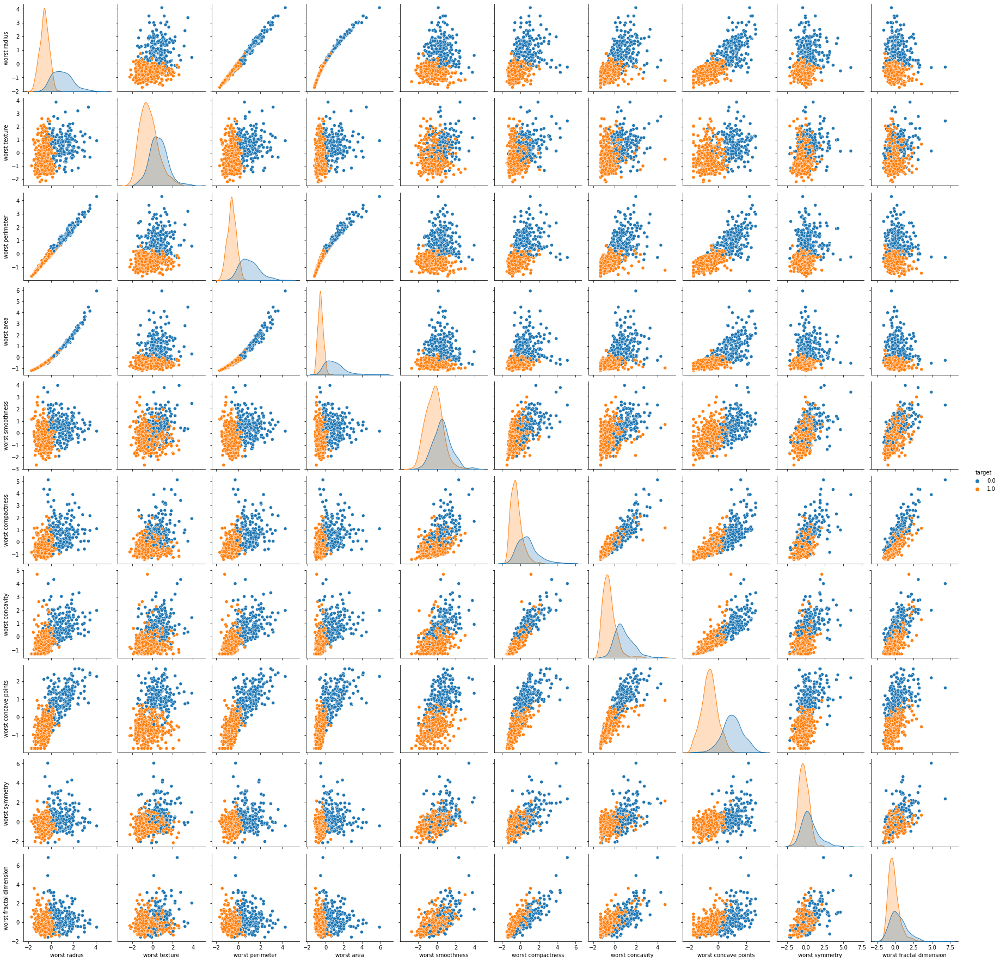

In [87]:
g2 = sns.pairplot(data_worsts_scaled,vars=worsts2, hue="target")

 <span style="color:red"> RESPONDA EL INCISO  (c) AQUÍ </span>

In [88]:
pca = decomposition.PCA(n_components=2)

scaler = StandardScaler()

X_data3 = scaler.fit_transform(cancer.data)

pca.fit(X_data3)
data3 = pca.transform(X_data3)

vr = pca.explained_variance_ratio_
print(pca.explained_variance_ratio_)

[0.44272026 0.18971182]


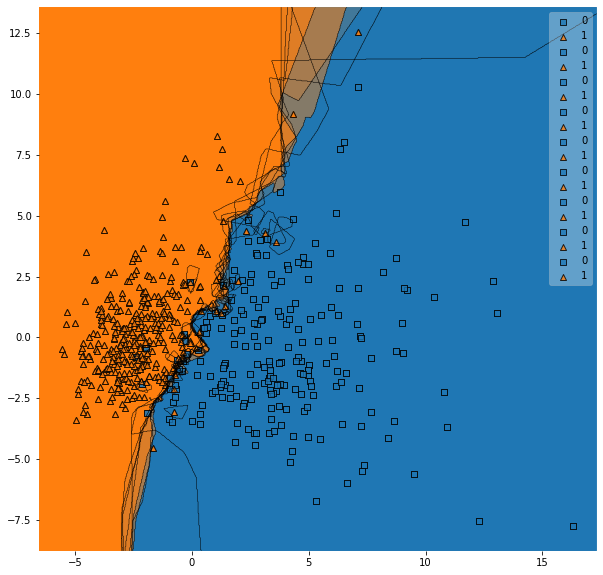

In [92]:
df = pd.DataFrame(data=np.c_[data3,y], columns=["PC1", "PC2", "labels"])

fig = plt.figure(figsize=(10,10))
for i in range(9):
    inn = KNeighborsClassifier(n_neighbors=i+1)
    inn.fit(data3, y)
    plot_decision_regions(data3, y, inn)

 <span style="color:red"> RESPONDA EL INCISO  (d) AQUÍ </span>

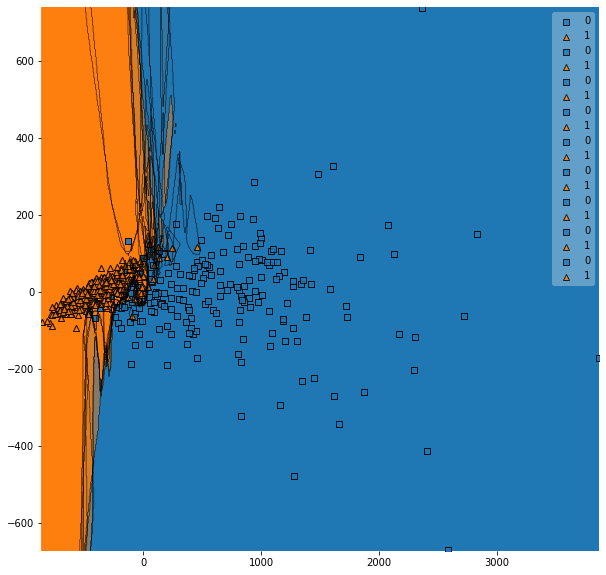

In [93]:
pca.fit(cancer.data)
data4 = pca.transform(cancer.data)
df4 = pd.DataFrame(data=np.c_[data4,y], columns=["PC1", "PC2", "labels"])

fig = plt.figure(figsize=(10,10))
for i in range(9):
    inn2 = KNeighborsClassifier(n_neighbors=i+1)
    inn2.fit(data4, y)
    plot_decision_regions(data4, y, inn2)

Observamos que si no escalamos los datos, los datos no se separan tan bien como cuando los escalamos y las regiones donde se ubican se "mezclan" mas en las zonas donde las distintas clases se solapan

 <span style="color:red"> RESPONDA EL INCISO  (e) AQUÍ </span>

knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179


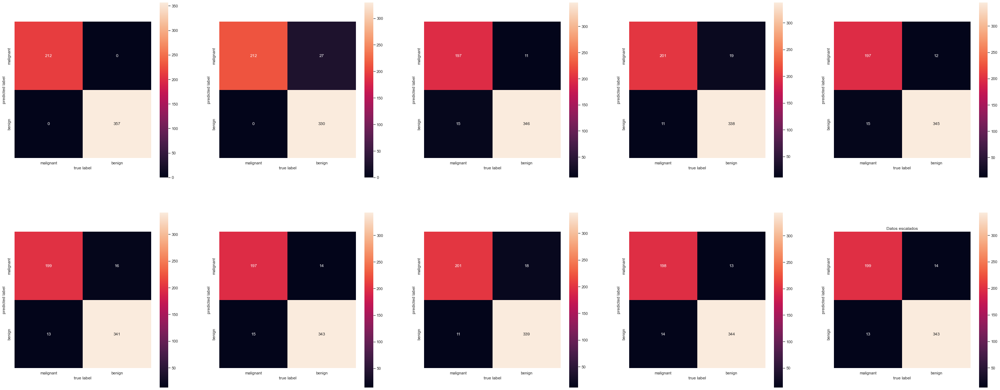

In [103]:
plt.subplots(2,5,figsize=(50,20))
plt.title('Datos escalados')
sns.set(rc = {'figure.figsize':(10,10)})

for i in range(10):
    inn2 = KNeighborsClassifier(n_neighbors=i+1)
    inn2_ = inn2.fit(data3, y)
    y_pred = inn2_.predict(data3)
    print('knn score')
    print(knn.score(data3, y))

    mat = confusion_matrix(y, y_pred)
    plt.subplot(2,5,i+1)
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,
                xticklabels=Y_labels, yticklabels=Y_labels)
    plt.xlabel('true label')
    plt.ylabel('predicted label');

knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179
knn score
0.9525483304042179


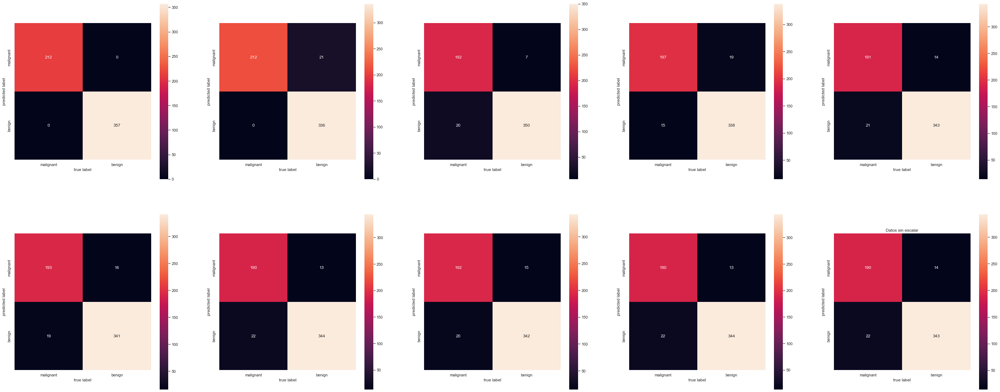

In [105]:
plt.subplots(2,5,figsize=(50,20))
plt.title('Datos sin escalar')
sns.set(rc = {'figure.figsize':(10,10)})

for i in range(10):
    inn2 = KNeighborsClassifier(n_neighbors=i+1)
    inn2_ = inn2.fit(data4, y)
    y_pred = inn2_.predict(data4)
    print('knn score')
    print(knn.score(data3, y))

    mat = confusion_matrix(y, y_pred)
    plt.subplot(2,5,i+1)
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,
                xticklabels=Y_labels, yticklabels=Y_labels)
    plt.xlabel('true label')
    plt.ylabel('predicted label');